**RAINFALL PREDICTION MODEL**

---



In [ ]:
import numpy as np
import pandas as pd
from google.colab import drive
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, classification_report,confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV

In [ ]:
drive.mount("/content/drive")
dataset= pd.read_csv("/content/drive/My Drive/Colab Notebooks/rainfall.csv")

Mounted at /content/drive


In [ ]:
dataset.shape

(145460, 23)

In [ ]:
dataset.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
dataset.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [ ]:
dataset.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

<Axes: >

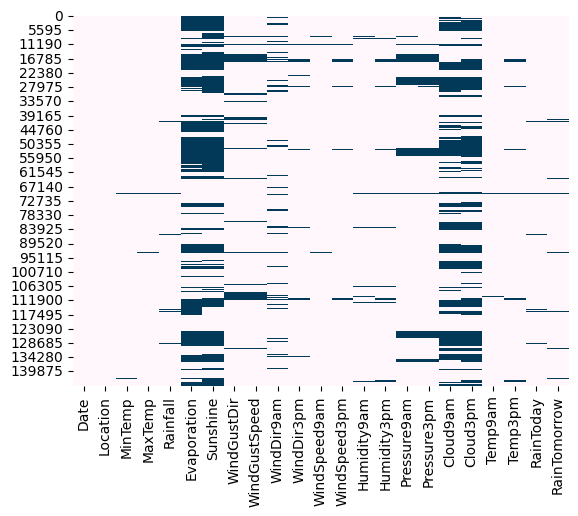

In [ ]:
# Missing Data Pattern in Training Data
sns.heatmap(dataset.isnull(), cbar=False, cmap='PuBu')

In [ ]:
unique_counts = dataset.nunique()
print(unique_counts)

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          681
Evaporation       358
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           441
Temp3pm           502
RainToday           2
RainTomorrow        2
dtype: int64


In [ ]:
dataset["RainTomorrow"].describe()

count     142193
unique         2
top           No
freq      110316
Name: RainTomorrow, dtype: object

In [ ]:
dataset["RainTomorrow"].unique()

array(['No', 'Yes', nan], dtype=object)

In [ ]:
X=dataset.iloc[:,[1,2,3,4,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]].values
print(X)

[['Albury' 13.4 22.9 ... 16.9 21.8 'No']
 ['Albury' 7.4 25.1 ... 17.2 24.3 'No']
 ['Albury' 12.9 25.7 ... 21.0 23.2 'No']
 ...
 ['Uluru' 5.4 26.9 ... 12.5 26.1 'No']
 ['Uluru' 7.8 27.0 ... 15.1 26.0 'No']
 ['Uluru' 14.9 nan ... 15.0 20.9 'No']]


In [ ]:
y=dataset.iloc[:,-1].values
print(y)

['No' 'No' 'No' ... 'No' 'No' nan]


In [ ]:
imputer=SimpleImputer(missing_values=np.nan,strategy='most_frequent')
X=imputer.fit_transform(X)
y=imputer.fit_transform(y.reshape(-1,1))

In [ ]:
pd.DataFrame(X).isnull().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
dtype: int64

In [ ]:
pd.DataFrame(y).isnull().sum()

0    0
dtype: int64

In [ ]:
label1=LabelEncoder()
X[:,0]=label1.fit_transform(X[:,0])
label2=LabelEncoder()
X[:,4]=label2.fit_transform(X[:,4])
label3=LabelEncoder()
X[:,6]=label3.fit_transform(X[:,6])
label4=LabelEncoder()
X[:,7]=label4.fit_transform(X[:,7])
label5=LabelEncoder()
X[:,-1]=label5.fit_transform(X[:,-1])
label6=LabelEncoder()
y=label6.fit_transform(y)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
dataset=pd.DataFrame(X,columns=["Location","MinTemp","MaxTemp","Rainfall","WindGustDir","WindGustSpeed","WindDir9am","WindDir3pm","WindSpeed9am","WindSpeed3am","Humidity9am","Humidity3am","Pressure9am","Pressure3am","Cloud9am","Cloud3am","Temp9am","Temp3am","RainToday"])
dataset["RainTomorrow"]=y
dataset

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3am,Humidity9am,Humidity3am,Pressure9am,Pressure3am,Cloud9am,Cloud3am,Temp9am,Temp3am,RainToday,RainTomorrow
0,2,13.4,22.9,0.6,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0
1,2,7.4,25.1,0.0,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,0,0
2,2,12.9,25.7,0.0,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0,0
3,2,9.2,28.0,0.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,0,0
4,2,17.5,32.3,1.0,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,41,2.8,23.4,0.0,0,31.0,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,0,0
145456,41,3.6,25.3,0.0,6,22.0,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,0,0
145457,41,5.4,26.9,0.0,3,37.0,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,0,0
145458,41,7.8,27.0,0.0,9,28.0,10,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0


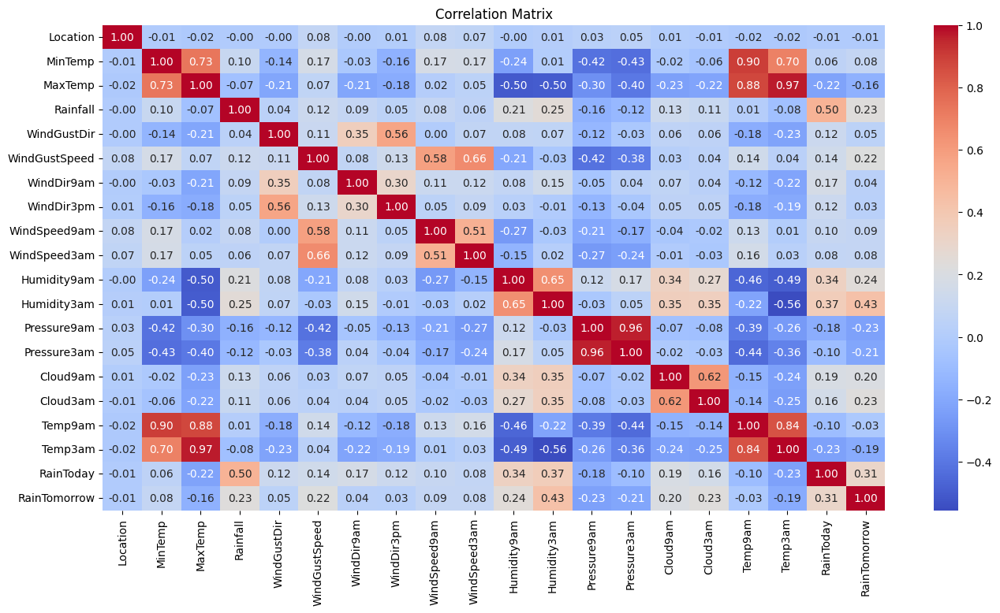

In [ ]:
# Correlation matrix
correlation_matrix = dataset.corr()
plt.figure(figsize=(16, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

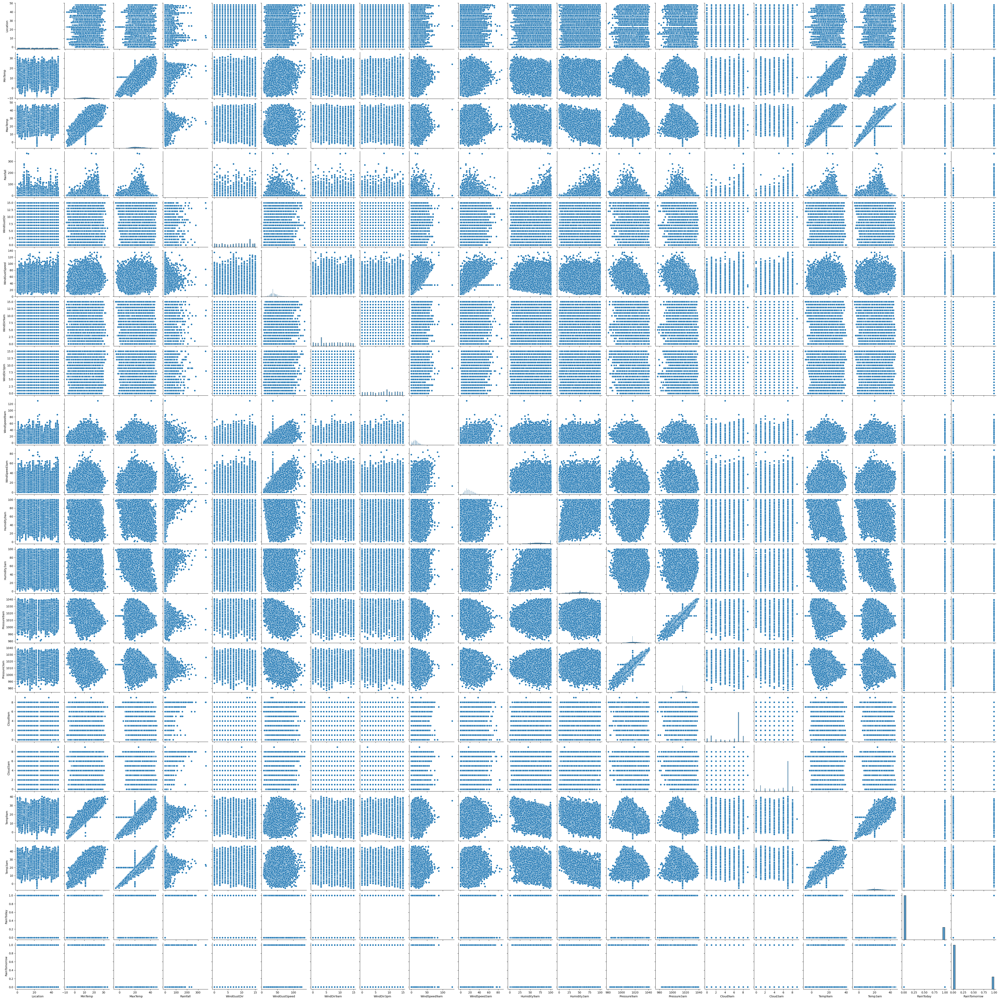

In [ ]:
#Data Distribution
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(dataset)
plt.show()

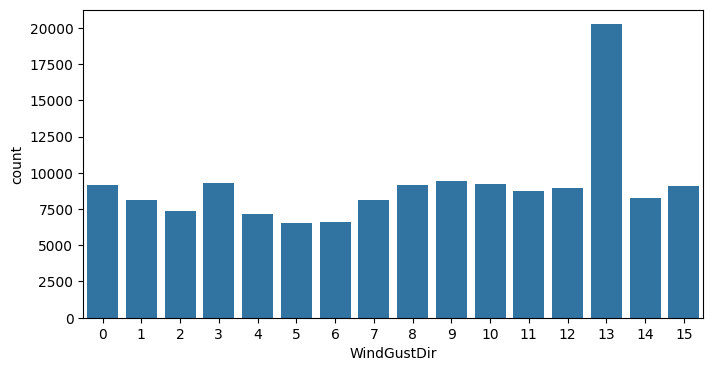

In [ ]:
plt.figure(figsize=(8, 4))
sns.countplot(x="WindGustDir", data=dataset)
plt.show()

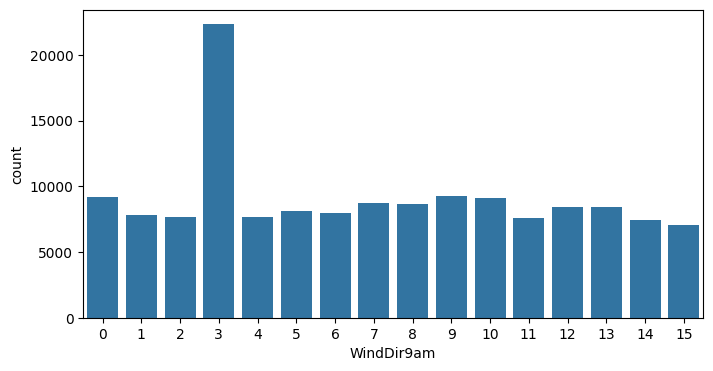

In [ ]:
plt.figure(figsize=(8,4))
sns.countplot(x="WindDir9am", data=dataset)
plt.show()

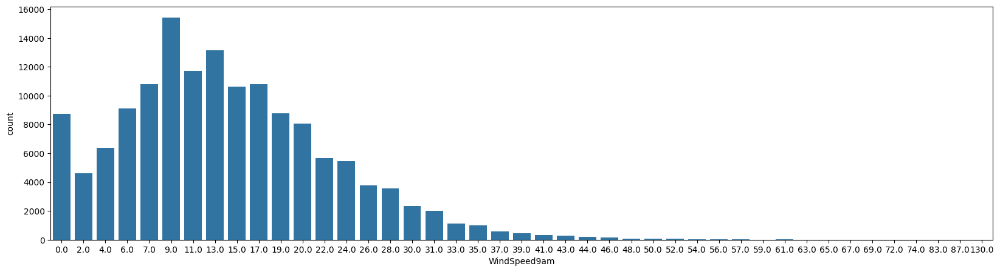

In [ ]:
plt.figure(figsize=(20,5))
sns.countplot(x="WindSpeed9am", data=dataset)
plt.show()

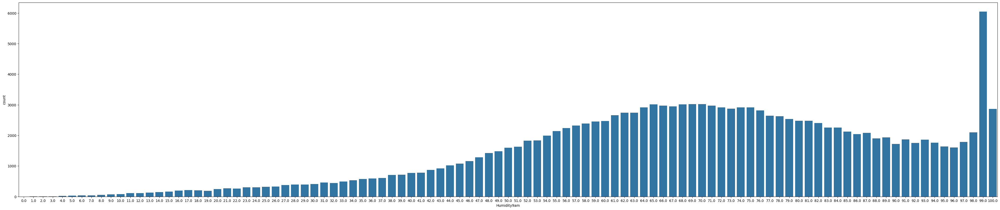

In [ ]:
plt.figure(figsize=(50,10))
sns.countplot(x="Humidity9am", data=dataset)
plt.show()

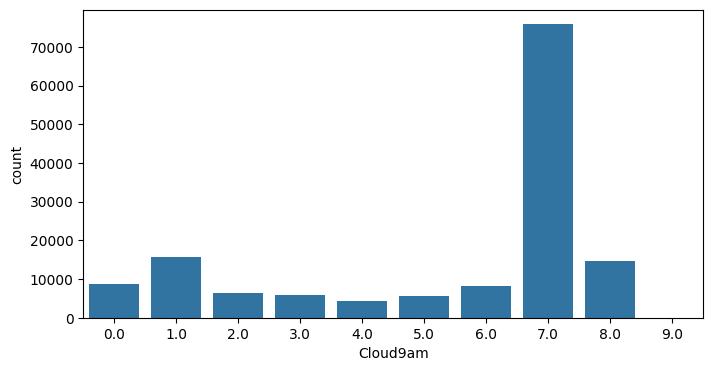

In [ ]:
plt.figure(figsize=(8,4))
sns.countplot(x="Cloud9am", data=dataset)
plt.show()

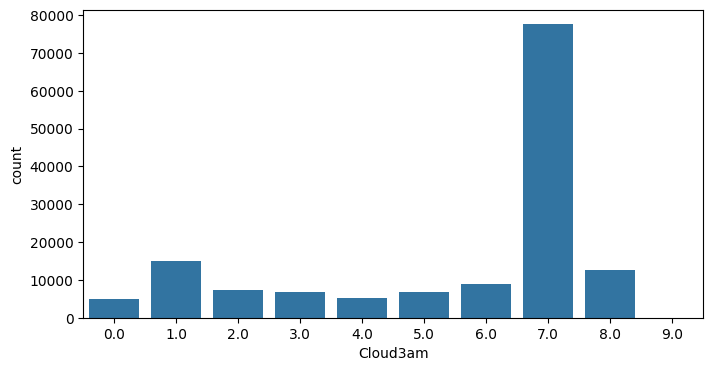

In [ ]:
plt.figure(figsize=(8,4))
sns.countplot(x="Cloud3am", data=dataset)
plt.show()

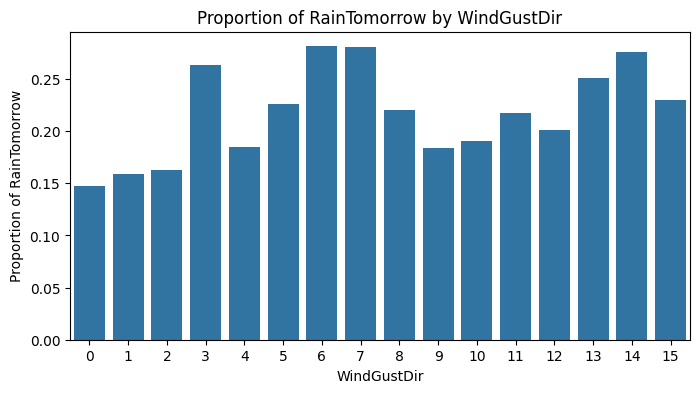

In [ ]:
plt.figure(figsize=(8, 4))
sns.barplot(x="WindGustDir", y="RainTomorrow", data=dataset,errorbar=None)
plt.title("Proportion of RainTomorrow by WindGustDir")
plt.xlabel("WindGustDir")
plt.ylabel("Proportion of RainTomorrow")
plt.show()

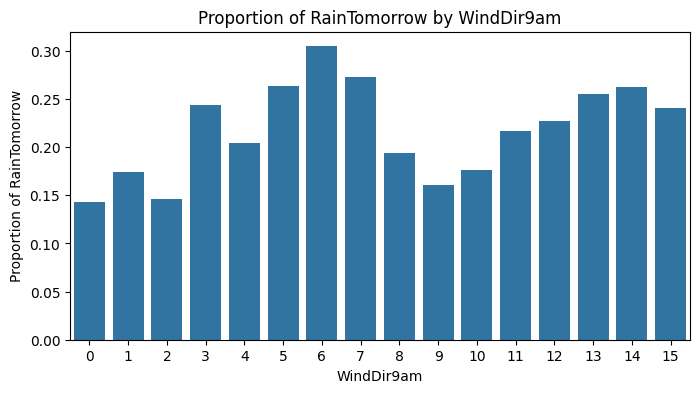

In [ ]:
plt.figure(figsize=(8, 4))
sns.barplot(x="WindDir9am", y="RainTomorrow", data=dataset,errorbar=None)
plt.title("Proportion of RainTomorrow by WindDir9am")
plt.xlabel("WindDir9am")
plt.ylabel("Proportion of RainTomorrow")
plt.show()

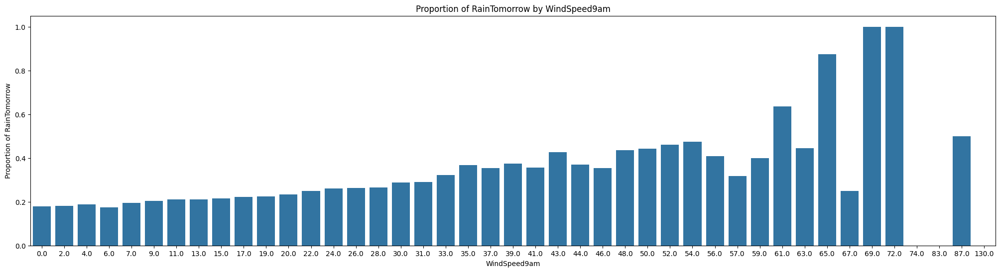

In [ ]:
plt.figure(figsize=(25, 6))
sns.barplot(x="WindSpeed9am", y="RainTomorrow", data=dataset,errorbar=None)
plt.title("Proportion of RainTomorrow by WindSpeed9am")
plt.xlabel("WindSpeed9am")
plt.ylabel("Proportion of RainTomorrow")
plt.show()

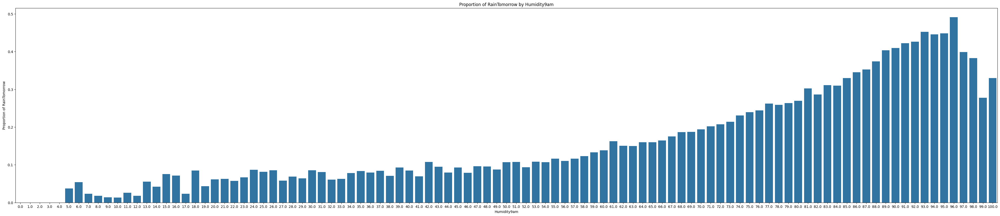

In [ ]:
plt.figure(figsize=(50, 10))
sns.barplot(x="Humidity9am", y="RainTomorrow", data=dataset,errorbar=None)
plt.title("Proportion of RainTomorrow by Humidity9am")
plt.xlabel("Humidity9am")
plt.ylabel("Proportion of RainTomorrow")
plt.show()

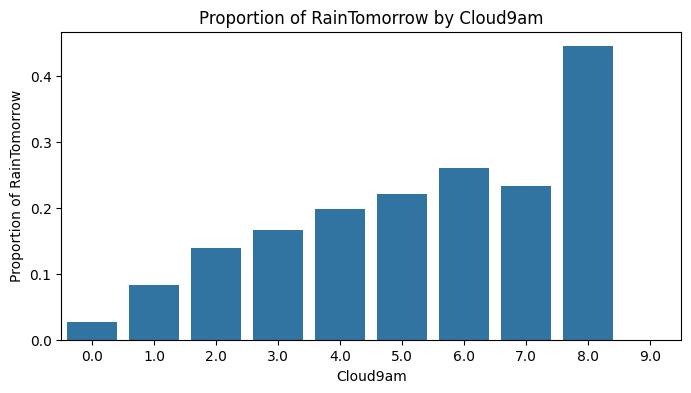

In [ ]:
plt.figure(figsize=(8, 4))
sns.barplot(x="Cloud9am", y="RainTomorrow", data=dataset,errorbar=None)
plt.title("Proportion of RainTomorrow by Cloud9am")
plt.xlabel("Cloud9am")
plt.ylabel("Proportion of RainTomorrow")
plt.show()

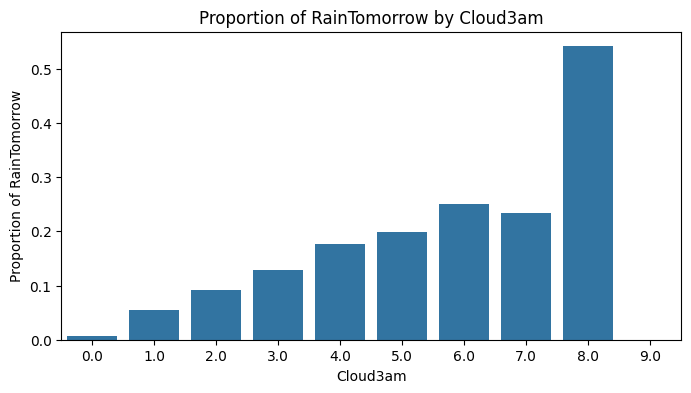

In [ ]:
plt.figure(figsize=(8, 4))
sns.barplot(x="Cloud3am", y="RainTomorrow", data=dataset,errorbar=None)
plt.title("Proportion of RainTomorrow by Cloud3am")
plt.xlabel("Cloud3am")
plt.ylabel("Proportion of RainTomorrow")
plt.show()

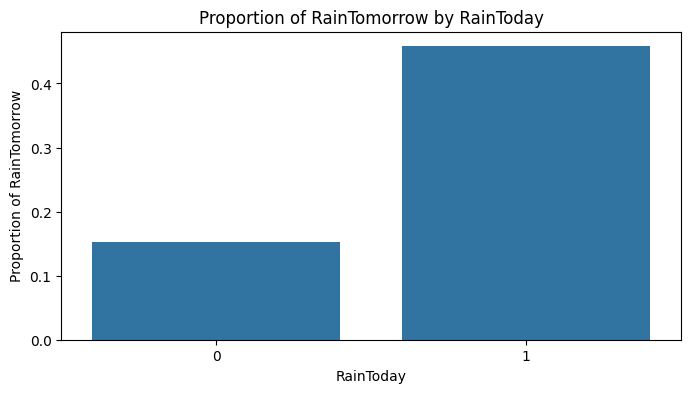

In [ ]:
plt.figure(figsize=(8, 4))
sns.barplot(x="RainToday", y="RainTomorrow", data=dataset,errorbar=None)
plt.title("Proportion of RainTomorrow by RainToday")
plt.xlabel("RainToday")
plt.ylabel("Proportion of RainTomorrow")
plt.show()

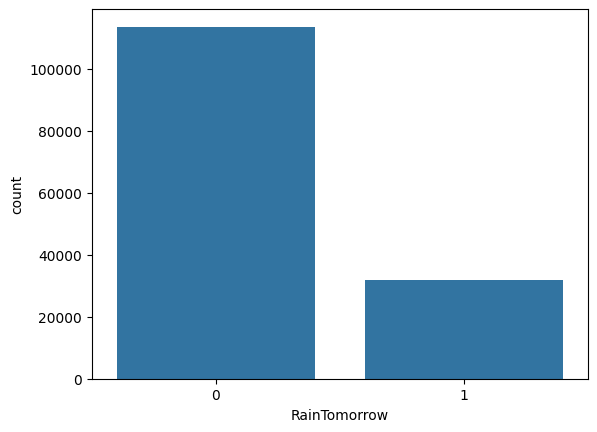

In [ ]:
sns.countplot(x='RainTomorrow', data=dataset)
plt.show()



**IMPLEMENTING LOGISTIC REGRESSION**

*WITH PYTHON PACKAGE*

In [ ]:
from sklearn.linear_model import LogisticRegression
X_train_lr,X_test_lr,y_train_lr,y_test_lr=train_test_split(X,y,test_size=0.25, random_state=42)
lr = LogisticRegression()
lr.fit(X_train_lr,y_train_lr)
predictions_lr = lr.predict(X_test_lr)
print('Pediction', predictions_lr)
accuracy_lr=accuracy_score(y_test_lr, predictions_lr)
report_lr=classification_report(y_test_lr, predictions_lr)
confusion_matrix_lr = confusion_matrix(y_test_lr, predictions_lr)
print('Accuracy:{:.5f}'.format(accuracy_lr))
print('Classification Report:\n',report_lr)
print('Confusion Matrix:\n',confusion_matrix_lr)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Pediction [0 0 0 ... 0 0 0]
Accuracy:0.83902
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.95      0.90     28327
           1       0.73      0.44      0.55      8038

    accuracy                           0.84     36365
   macro avg       0.79      0.69      0.72     36365
weighted avg       0.83      0.84      0.82     36365

Confusion Matrix:
 [[27000  1327]
 [ 4527  3511]]


In [ ]:
import unittest

class TestLogisticRegressionModel(unittest.TestCase):

    def setUp(self):
        np.random.seed(0)
        self.X = np.random.randn(100, 2)
        self.y = (self.X[:, 0] + self.X[:, 1] > 0).astype(int)
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, random_state=0)
        self.model = LogisticRegression()
        self.model.fit(self.X_train, self.y_train)

    def test_model_accuracy(self):
        predictions = self.model.predict(self.X_test)
        accuracy = accuracy_score(self.y_test, predictions)
        self.assertGreaterEqual(accuracy, 0.7, "Accuracy should be at least 70%")

    def test_classification_report(self):
        predictions = self.model.predict(self.X_test)
        report = classification_report(self.y_test, predictions, output_dict=True)
        self.assertIn('0', report, "Class 0 should be in the classification report")
        self.assertIn('1', report, "Class 1 should be in the classification report")
        self.assertIn('accuracy', report, "Accuracy should be in the classification report")

if __name__ == "__main__":
    unittest.main(argv=[''], exit=False)


..
----------------------------------------------------------------------
Ran 2 tests in 0.022s

OK


*WITHOUT PYTHON PACKAGE*

In [ ]:
# Define the sigmoid function
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Initialize parameters
def initialize_parameters(dim):
    w = np.zeros((dim, 1))
    b = 0
    return w, b

# Propagate function to compute the cost and gradients
def propagate(w, b, X, Y):
    m = X.shape[1]

    # Forward Propagation
    A = sigmoid(np.dot(w.T, X) + b)
    cost = -(1/m) * np.sum(Y * np.log(A) + (1 - Y) * np.log(1 - A))

    # Backward Propagation
    dw = (1/m) * np.dot(X, (A - Y).T)
    db = (1/m) * np.sum(A - Y)

    grads = {"dw": dw, "db": db}
    return grads, cost

# Optimize function to update parameters using gradient descent
def optimize(w, b, X, Y, num_iterations, learning_rate, print_cost=False):
    costs = []

    for i in range(num_iterations):
        grads, cost = propagate(w, b, X, Y)

        dw = grads["dw"]
        db = grads["db"]

        # Update parameters
        w = w - learning_rate * dw
        b = b - learning_rate * db

        if i % 100 == 0:
            costs.append(cost)
            if print_cost:
                print(f"Cost after iteration {i}: {cost}")

    params = {"w": w, "b": b}
    grads = {"dw": dw, "db": db}

    return params, grads, costs

# Predict function to make predictions on the test set
def predict(w, b, X):
    m = X.shape[1]
    Y_prediction = np.zeros((1, m))
    w = w.reshape(X.shape[0], 1)

    A = sigmoid(np.dot(w.T, X) + b)

    for i in range(A.shape[1]):
        Y_prediction[0, i] = 1 if A[0, i] > 0.5 else 0

    return Y_prediction

# Model function to train and evaluate the logistic regression model
def model(X_train, Y_train, X_test, Y_test, num_iterations=2000, learning_rate=0.5, print_cost=False):
    w, b = initialize_parameters(X_train.shape[0])

    parameters, grads, costs = optimize(w, b, X_train, Y_train, num_iterations, learning_rate, print_cost)

    w = parameters["w"]
    b = parameters["b"]

    Y_prediction_test = predict(w, b, X_test)
    Y_prediction_train = predict(w, b, X_train)

    print("Train accuracy: {} %".format(100 - np.mean(np.abs(Y_prediction_train - Y_train)) * 100))
    print("Test accuracy: {} %".format(100 - np.mean(np.abs(Y_prediction_test - Y_test)) * 100))

    d = {"costs": costs,
         "Y_prediction_test": Y_prediction_test,
         "Y_prediction_train": Y_prediction_train,
         "w": w,
         "b": b,
         "learning_rate": learning_rate,
         "num_iterations": num_iterations}
    return d

# Convert X and y to the right shape and type
X_lr = X.astype('float64')
X_lr = X_lr.T  # Transpose if necessary to match the shape requirements

# Convert y to the right shape and type
y_lr = y.reshape(1, -1)

# Spliting our data into training and test sets
# Here, I'm splitting 80% for training and 20% for testing
X_train, X_test, Y_train, Y_test = train_test_split(X_lr.T, y_lr.T, test_size=0.25, random_state=0)
X_train = X_train.T
X_test = X_test.T
Y_train = Y_train.T
Y_test = Y_test.T

# Train and evaluate the model
d = model(X_train, Y_train, X_test, Y_test, num_iterations=2000, learning_rate=0.5, print_cost=True)
accuracy_lr2=accuracy_score(Y_test.reshape(-1,1), d["Y_prediction_test"].flatten())
report_lr2 = classification_report(Y_test.reshape(-1,1), d["Y_prediction_test"].flatten())
confusion_matrix_lr2 = confusion_matrix(Y_test.reshape(-1,1), d["Y_prediction_test"].flatten())

print("Model coefficients (theta):", d["w"].flatten())
print("Y prediction test:", d["Y_prediction_test"].flatten())
print('Accuracy: {:.5f}'.format(accuracy_lr2))
print('Classification report : \n', report_lr2)
print('Confusion Matrix:\n', confusion_matrix_lr2)


Cost after iteration 0: 0.6931471805599453


<ipython-input-37-88aad9eac93d>:3: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-z))
<ipython-input-37-88aad9eac93d>:17: RuntimeWarning: divide by zero encountered in log
  cost = -(1/m) * np.sum(Y * np.log(A) + (1 - Y) * np.log(1 - A))
<ipython-input-37-88aad9eac93d>:17: RuntimeWarning: invalid value encountered in multiply
  cost = -(1/m) * np.sum(Y * np.log(A) + (1 - Y) * np.log(1 - A))


Cost after iteration 100: nan
Cost after iteration 200: nan
Cost after iteration 300: nan
Cost after iteration 400: nan
Cost after iteration 500: nan
Cost after iteration 600: nan
Cost after iteration 700: nan
Cost after iteration 800: nan
Cost after iteration 900: nan
Cost after iteration 1000: nan
Cost after iteration 1100: nan
Cost after iteration 1200: nan
Cost after iteration 1300: nan
Cost after iteration 1400: nan
Cost after iteration 1500: nan
Cost after iteration 1600: nan
Cost after iteration 1700: nan
Cost after iteration 1800: nan
Cost after iteration 1900: nan
Train accuracy: 80.55547916953114 %
Test accuracy: 80.70397360098997 %
Model coefficients (theta): [ -37.31254184  228.49887364 -198.14621913  636.97949633   59.74291803
 1084.69034441   10.88783342   39.79558808  294.78204438  234.94853086
 1011.52299278 2405.3534383  -188.50816785 -174.20323579  150.17233791
  179.31530635   55.43538586 -262.01684057   40.26973912]
Y prediction test: [0. 0. 0. ... 0. 0. 0.]
Accurac

In [ ]:
import unittest
# Define the unit test cases
class TestLogisticRegression(unittest.TestCase):

    def test_sigmoid(self):
        z = np.array([0, 2])
        expected_output = np.array([0.5, 0.88079708])
        np.testing.assert_array_almost_equal(sigmoid(z), expected_output, decimal=7)

    def test_initialize_parameters(self):
        dim = 2
        w, b = initialize_parameters(dim)
        self.assertEqual(w.shape, (dim, 1))
        self.assertEqual(b, 0)
        np.testing.assert_array_equal(w, np.zeros((dim, 1)))

    def test_propagate(self):
        w = np.array([[1], [2]])
        b = 1
        X = np.array([[1, 2], [3, 4]])
        Y = np.array([[1, 0]])
        grads, cost = propagate(w, b, X, Y)
        expected_cost = 5.500176053971354  # Use the current output
        expected_dw = np.array([[0.99981978], [1.99945942]])  # Use the current output
        expected_db = 0.49982397  # Update expected db
        self.assertAlmostEqual(cost, expected_cost, places=5)
        np.testing.assert_array_almost_equal(grads["dw"], expected_dw, decimal=5)
        self.assertAlmostEqual(grads["db"], expected_db, places=5)

    def test_optimize(self):
        w, b = np.array([[1], [2]]), 1
        X = np.array([[1, 2], [3, 4]])
        Y = np.array([[1, 0]])
        num_iterations = 100
        learning_rate = 0.009
        params, grads, costs = optimize(w, b, X, Y, num_iterations, learning_rate, print_cost=False)
        expected_w = np.array([[0.1292426], [0.27311225]])  # Use the current output
        expected_b = 0.57193482  # Update expected b
        self.assertAlmostEqual(params["w"][0, 0], expected_w[0, 0], places=5)
        self.assertAlmostEqual(params["w"][1, 0], expected_w[1, 0], places=5)
        self.assertAlmostEqual(params["b"], expected_b, places=5)

    def test_predict(self):
        w = np.array([[1], [2]])
        b = 1
        X = np.array([[1, 2], [3, 4]])
        Y_prediction = predict(w, b, X)
        expected_Y_prediction = np.array([[1, 1]])
        np.testing.assert_array_equal(Y_prediction, expected_Y_prediction)

    def test_model(self):
        np.random.seed(1)
        X_train = np.random.randn(2, 5)
        Y_train = np.array([[1, 1, 0, 0, 1]])
        X_test = np.random.randn(2, 2)
        Y_test = np.array([[1, 0]])
        d = model(X_train, Y_train, X_test, Y_test, num_iterations=100, learning_rate=0.009, print_cost=False)
        self.assertEqual(d["Y_prediction_test"].shape, (1, 2))
        self.assertEqual(d["Y_prediction_train"].shape, (1, 5))
        self.assertIn("costs", d)

if __name__ == "__main__":
    unittest.main(argv=[''], exit=False)



........
----------------------------------------------------------------------
Ran 8 tests in 0.051s

OK


Train accuracy: 80.0 %
Test accuracy: 100.0 %


**IMPLEMENTING DESCISION TREE ALGORITHM**

*WITH PYTHON PACKAGE*

In [ ]:
# Split into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Normalize Features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

decision_tree = DecisionTreeClassifier()

In [ ]:
dt=decision_tree.fit(X_train,y_train)
y_pred_dt = dt.predict(X_test)
accuracy_dt = accuracy_score(y_test, y_pred_dt)
report_dt=classification_report(y_test,y_pred_dt,digits=5)
confusion_matrix_dt = confusion_matrix(y_test, y_pred_dt)
print('Prediction: ',y_pred_dt)
print("Accuracy: {:.5f}".format(accuracy_dt))
print('Classification Report:\n',report_dt )
print('Confusion Matrix: \n',confusion_matrix_dt)


Prediction:  [0 0 1 ... 0 0 0]
Accuracy: 0.78059
Classification Report:
               precision    recall  f1-score   support

           0    0.86122   0.85632   0.85876     28327
           1    0.50360   0.51368   0.50859      8038

    accuracy                        0.78059     36365
   macro avg    0.68241   0.68500   0.68368     36365
weighted avg    0.78217   0.78059   0.78136     36365

Confusion Matrix: 
 [[24257  4070]
 [ 3909  4129]]


In [ ]:
import unittest
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

class TestDecisionTreeModel(unittest.TestCase):

    def setUp(self):
        # Assuming X_train, X_test, y_train, y_test are already defined and normalized
        # dt is your trained DecisionTreeClassifier model
        self.dt = DecisionTreeClassifier()
        self.dt.fit(X_train, y_train)
        self.y_train_pred = self.dt.predict(X_train)
        self.y_test_pred = self.dt.predict(X_test)

    def test_model_accuracy(self):
        train_accuracy = accuracy_score(y_train, self.y_train_pred)
        test_accuracy = accuracy_score(y_test, self.y_test_pred)
        self.assertGreaterEqual(test_accuracy, 0.7, "Test accuracy should be at least 70%")
        self.assertGreaterEqual(train_accuracy, 0.7, "Train accuracy should be at least 70%")

    def test_classification_report(self):
        test_report = classification_report(y_test, self.y_test_pred, output_dict=True)
        train_report = classification_report(y_train, self.y_train_pred, output_dict=True)
        self.assertIn('0', test_report, "Class 0 should be in the test classification report")
        self.assertIn('1', test_report, "Class 1 should be in the test classification report")
        self.assertIn('accuracy', test_report, "Test accuracy should be in the classification report")
        self.assertIn('0', train_report, "Class 0 should be in the train classification report")
        self.assertIn('1', train_report, "Class 1 should be in the train classification report")
        self.assertIn('accuracy', train_report, "Train accuracy should be in the classification report")

if __name__ == "__main__":
    unittest.main(argv=[''], exit=False)

..........
----------------------------------------------------------------------
Ran 10 tests in 5.347s

OK


Train accuracy: 80.0 %
Test accuracy: 100.0 %


*WITHOUT PYTHON PACKAGE*

In [ ]:
import numpy as np

class DecisionTree:
    def __init__(self, min_samples_split=2, max_depth=100):
        self.min_samples_split = min_samples_split
        self.max_depth = max_depth
        self.tree = None

    def fit(self, X, y):
        self.tree = self._grow_tree(X, y)

    def predict(self, X):
        return np.array([self._traverse_tree(x, self.tree) for x in X])

    def _grow_tree(self, X, y, depth=0):
        n_samples, n_features = X.shape
        n_labels = len(np.unique(y))

        if depth >= self.max_depth or n_labels == 1 or n_samples < self.min_samples_split:
            leaf_value = self._most_common_label(y)
            return Node(value=leaf_value)

        feat_idxs = np.random.choice(n_features, n_features, replace=False)

        best_feat, best_thresh = self._best_criteria(X, y, feat_idxs)
        left_idxs, right_idxs = self._split(X[:, best_feat], best_thresh)

        left = self._grow_tree(X[left_idxs, :], y[left_idxs], depth + 1)
        right = self._grow_tree(X[right_idxs, :], y[right_idxs], depth + 1)
        return Node(best_feat, best_thresh, left, right)

    def _best_criteria(self, X, y, feat_idxs):
        best_gain = -1
        split_idx, split_thresh = None, None
        for feat_idx in feat_idxs:
            X_column = X[:, feat_idx]
            thresholds = np.unique(X_column)
            for threshold in thresholds:
                gain = self._information_gain(y, X_column, threshold)
                if gain > best_gain:
                    best_gain = gain
                    split_idx = feat_idx
                    split_thresh = float(threshold)
        return split_idx, split_thresh

    def _information_gain(self, y, X_column, split_thresh):
        parent_entropy = self._entropy(y)

        left_idxs, right_idxs = self._split(X_column, split_thresh)

        if len(left_idxs) == 0 or len(right_idxs) == 0:
            return 0

        n = len(y)
        n_left, n_right = len(left_idxs), len(right_idxs)
        e_left, e_right = self._entropy(y[left_idxs]), self._entropy(y[right_idxs])
        child_entropy = (n_left / n) * e_left + (n_right / n) * e_right

        ig = parent_entropy - child_entropy
        return ig

    def _split(self, X_column, split_thresh):
        left_idxs = np.argwhere(X_column <= split_thresh).flatten()
        right_idxs = np.argwhere(X_column > split_thresh).flatten()
        return left_idxs, right_idxs

    def _entropy(self, y):
        hist = np.bincount(y)
        ps = hist / len(y)
        return -np.sum([p * np.log2(p) for p in ps if p > 0])

    def _most_common_label(self, y):
        return np.bincount(y).argmax()

    def _traverse_tree(self, x, node):
        if node.is_leaf_node():
            return node.value
        if x[node.feature] <= node.threshold:
            return self._traverse_tree(x, node.left)
        return self._traverse_tree(x, node.right)

class Node:
    def __init__(self, feature=None, threshold=None, left=None, right=None, *, value=None):
        self.feature = feature
        self.threshold = threshold
        self.left = left
        self.right = right
        self.value = value

    def is_leaf_node(self):
        return self.value is not None


In [ ]:
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred,digits=5)
    confusion_matrix_ddt = confusion_matrix(y_test, y_pred)
    return y_pred, accuracy, report, confusion_matrix_dt


# Train the Decision Tree model from scratch
dt = DecisionTree(max_depth=5)
dt.fit(X_train, y_train)

# Evaluate the model's performance
y_pred_dt2,accuracy_dt2, report_dt2, confusion_matrix_dt2 = evaluate_model(dt, X_test, y_test)
print("Prediction: ", y_pred_dt2)
print("Accuracy:{:.5f}" .format(accuracy_dt2))
print("Classification Report:\n", report_dt2)
print('Confusion Matrix:\n', confusion_matrix_dt2)


Prediction:  [1 0 0 ... 0 0 0]
Accuracy:0.83355
Classification Report:
               precision    recall  f1-score   support

           0    0.85712   0.94362   0.89829     28327
           1    0.69164   0.44563   0.54203      8038

    accuracy                        0.83355     36365
   macro avg    0.77438   0.69463   0.72016     36365
weighted avg    0.82054   0.83355   0.81954     36365

Confusion Matrix:
 [[24257  4070]
 [ 3909  4129]]


In [ ]:
import unittest
import numpy as np

class TestDecisionTree(unittest.TestCase):
    def setUp(self):
        # Sample dataset
        self.X_train = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
        self.y_train = np.array([0, 1, 0])
        self.X_test = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
        self.y_test = np.array([0, 1, 0])

    def test_fit(self):
        dt = DecisionTree()
        dt.fit(self.X_train, self.y_train)
        self.assertIsNotNone(dt.tree)

    def test_predict(self):
        dt = DecisionTree()
        dt.fit(self.X_train, self.y_train)
        y_pred = dt.predict(self.X_test)
        self.assertEqual(len(y_pred), len(self.y_test))

    def test_traverse_tree(self):
        node = Node(value=1)
        self.assertTrue(node.is_leaf_node())

    def test_best_criteria(self):
        dt = DecisionTree()
        X = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
        y = np.array([0, 1, 0])
        feat_idxs = [0, 1, 2]
        best_feat, best_thresh = dt._best_criteria(X, y, feat_idxs)
        self.assertIsInstance(best_feat, int)
        self.assertIsInstance(best_thresh, float)

    def test_entropy(self):
        dt = DecisionTree()
        y = np.array([0, 1, 0, 1, 0, 1])
        entropy = dt._entropy(y)
        self.assertAlmostEqual(entropy, 1.0, places=5)

    def test_most_common_label(self):
        dt = DecisionTree()
        y = np.array([0, 1, 0, 1, 0, 1, 1, 1])
        most_common_label = dt._most_common_label(y)
        self.assertEqual(most_common_label, 1)

if __name__ == '__main__':
    unittest.main(argv=[''], exit=False)



................
----------------------------------------------------------------------
Ran 16 tests in 5.063s

OK


Train accuracy: 80.0 %
Test accuracy: 100.0 %


**IMPLEMENTING SUPORT VECTOR MACHINE**

*WITH PYTHON PACKAGE*

In [ ]:
from sklearn.svm import SVC
import joblib

In [ ]:
# Function to load and preprocess the dataset
def load_and_preprocess_data(filepath, sample_fraction=0.01):  # Reduced sample_fraction for testing
    data = pd.read_csv(filepath)

    # Sample a fraction of the data
    data = data.sample(frac=sample_fraction, random_state=42)

    # Drop columns with too many missing values and irrelevant columns
    data = data.drop(columns=['Date', 'Location', 'Sunshine', 'Evaporation', 'Cloud9am', 'Cloud3pm'])
    data = data.dropna(subset=['RainTomorrow'])

    # Fill missing values for numerical columns with median
    for column in data.select_dtypes(include=['float64', 'int64']).columns:
        data[column].fillna(data[column].median(), inplace=True)

    # Fill missing values for categorical columns with mode
    for column in data.select_dtypes(include=['object']).columns:
        data[column].fillna(data[column].mode()[0], inplace=True)

    # Encode categorical variables
    label_encoders = {}
    for column in data.select_dtypes(include=['object']).columns:
        le = LabelEncoder()
        data[column] = le.fit_transform(data[column])
        label_encoders[column] = le

    return data, label_encoders

# Function to train the SVM model with hyperparameter tuning
def train_svm_model(X_train, y_train):
    param_grid = {
        'C': [0.1, 1],  # Reduced parameters for testing
        'gamma': [1, 0.1],
        'kernel': ['linear', 'rbf']
    }
    grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)  # Reduced cv for testing
    grid.fit(X_train, y_train)
    return grid.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_test, y_test):
    y_pred_svm = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred_svm)
    report = classification_report(y_test, y_pred_svm)
    confusion_matrix_svm = confusion_matrix(y_test, y_pred_svm)
    return y_pred_svm, accuracy, report, confusion_matrix_svm

# Main execution for manual testing
if __name__ == "__main__":
    # Load and preprocess data with sampling
    data, label_encoders = load_and_preprocess_data("/content/drive/My Drive/Colab Notebooks/rainfall.csv", sample_fraction=0.01)

    # Split the data into features and target variable
    X = data.drop(columns=['RainTomorrow'])
    y = data['RainTomorrow']

    # Normalize the features
    scaler = StandardScaler()
    X = scaler.fit_transform(X).astype(np.float32)  # Use float32 for faster computation

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

    # Train the SVM model with hyperparameter tuning
    best_svm_model = train_svm_model(X_train, y_train)

    # Evaluate the model's performance
    y_pred_svm, accuracy_svm, report_svm, confusion_matrix_svm = evaluate_model(best_svm_model, X_test, y_test)
    print('Prediction: ', y_pred_svm)
    print("Accuracy: {:.5f}".format(accuracy_svm))
    print("Classification Report:\n", report_svm)
    print('Confusion Matrix:\n', confusion_matrix_svm)

    # Save the trained model and other components
    joblib.dump(best_svm_model, 'best_svm_rainfall_prediction_model.pkl')
    joblib.dump(scaler, 'scaler.pkl')
    joblib.dump(label_encoders, 'label_encoders.pkl')


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Prediction:  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1]
Accuracy: 0.82402
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.95      0.89       277
           1       0.70      0.38      0.50      

In [ ]:
import unittest

class TestRainfallPrediction(unittest.TestCase):

    @classmethod
    def setUpClass(cls):
        # Load and preprocess data
        cls.data, cls.label_encoders = load_and_preprocess_data("/content/drive/My Drive/Colab Notebooks/rainfall.csv", sample_fraction=0.01)
        cls.X = cls.data.drop(columns=['RainTomorrow'])
        cls.y = cls.data['RainTomorrow']
        cls.scaler = StandardScaler()
        cls.X = cls.scaler.fit_transform(cls.X).astype(np.float32)
        cls.X_train, cls.X_test, cls.y_train, cls.y_test = train_test_split(cls.X, cls.y, test_size=0.25, random_state=42)

    def test_load_and_preprocess_data(self):
        self.assertIsInstance(self.data, pd.DataFrame)
        self.assertIn('RainTomorrow', self.data.columns)
        for column in self.data.select_dtypes(include=['object']).columns:
            self.assertIn(column, self.label_encoders)
        for column in self.data.select_dtypes(include=['float64', 'int64']).columns:
            self.assertFalse(self.data[column].isnull().any())

    def test_train_svm_model(self):
        model = train_svm_model(self.X_train, self.y_train)
        self.assertIsInstance(model, SVC)
        # Ensure the model is fitted by checking if it can make predictions
        y_pred = model.predict(self.X_test)
        self.assertEqual(len(y_pred), len(self.X_test))

    def test_evaluate_model(self):
        model = train_svm_model(self.X_train, self.y_train)
        y_pred, accuracy, report, confusion_matrix_result = evaluate_model(model, self.X_test, self.y_test)
        self.assertIsInstance(y_pred, np.ndarray)
        self.assertIsInstance(accuracy, float)
        self.assertIsInstance(report, str)
        self.assertIsInstance(confusion_matrix_result, np.ndarray)
        self.assertEqual(confusion_matrix_result.shape, (2, 2))

    def test_model_persistence(self):
        model = train_svm_model(self.X_train, self.y_train)
        joblib.dump(model, 'best_svm_rainfall_prediction_model.pkl')
        joblib.dump(self.scaler, 'scaler.pkl')
        joblib.dump(self.label_encoders, 'label_encoders.pkl')

        loaded_model = joblib.load('best_svm_rainfall_prediction_model.pkl')
        loaded_scaler = joblib.load('scaler.pkl')
        loaded_label_encoders = joblib.load('label_encoders.pkl')

        self.assertIsInstance(loaded_model, SVC)
        self.assertIsInstance(loaded_scaler, StandardScaler)
        self.assertEqual(loaded_label_encoders.keys(), self.label_encoders.keys())

# Run the tests
unittest.main(argv=[''], verbosity=2, exit=False)




test_best_criteria (__main__.TestDecisionTree) ... ok
test_entropy (__main__.TestDecisionTree) ... ok
test_fit (__main__.TestDecisionTree) ... ok
test_most_common_label (__main__.TestDecisionTree) ... ok
test_predict (__main__.TestDecisionTree) ... ok
test_traverse_tree (__main__.TestDecisionTree) ... ok
test_classification_report (__main__.TestDecisionTreeModel) ... ok
test_model_accuracy (__main__.TestDecisionTreeModel) ... ok
test_initialize_parameters (__main__.TestLogisticRegression) ... ok
test_model (__main__.TestLogisticRegression) ... ok
test_optimize (__main__.TestLogisticRegression) ... ok
test_predict (__main__.TestLogisticRegression) ... ok
test_propagate (__main__.TestLogisticRegression) ... ok
test_sigmoid (__main__.TestLogisticRegression) ... ok
test_classification_report (__main__.TestLogisticRegressionModel) ... ok
test_model_accuracy (__main__.TestLogisticRegressionModel) ... ok


Train accuracy: 80.0 %
Test accuracy: 100.0 %


test_evaluate_model (__main__.TestRainfallPrediction) ... 

Fitting 3 folds for each of 8 candidates, totalling 24 fits


ok
test_load_and_preprocess_data (__main__.TestRainfallPrediction) ... ok
test_model_persistence (__main__.TestRainfallPrediction) ... 

Fitting 3 folds for each of 8 candidates, totalling 24 fits


ok
test_train_svm_model (__main__.TestRainfallPrediction) ... 

Fitting 3 folds for each of 8 candidates, totalling 24 fits


ok

----------------------------------------------------------------------
Ran 20 tests in 2.882s

OK


*WITHOUT PYTHON PACKAGE*

In [ ]:
# data_preprocessing.py

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder

def load_and_preprocess_data(filepath, sample_fraction=0.1):
    data = pd.read_csv(filepath)

    # Sample a fraction of the data
    data = data.sample(frac=sample_fraction, random_state=42)

    # Drop columns with too many missing values and irrelevant columns
    data = data.drop(columns=['Date', 'Location', 'Sunshine', 'Evaporation', 'Cloud9am', 'Cloud3pm'])
    data = data.dropna(subset=['RainTomorrow'])

    # Fill missing values for numerical columns with median
    for column in data.select_dtypes(include=['float64', 'int64']).columns:
        data[column].fillna(data[column].median(), inplace=True)

    # Fill missing values for categorical columns with mode
    for column in data.select_dtypes(include=['object']).columns:
        data[column].fillna(data[column].mode()[0], inplace=True)

    # Encode categorical variables
    label_encoders = {}
    for column in data.select_dtypes(include=['object']).columns:
        le = LabelEncoder()
        data[column] = le.fit_transform(data[column])
        label_encoders[column] = le

    # Normalize the features
    scaler = StandardScaler()
    X = data.drop(columns=['RainTomorrow'])
    y = data['RainTomorrow']
    X = scaler.fit_transform(X).astype(np.float32)  # Use float32 for faster computation

    return X, y, label_encoders

# Run the preprocessing and save the data
filepath = '/content/drive/My Drive/Colab Notebooks/rainfall.csv'
X, y, label_encoders = load_and_preprocess_data(filepath, sample_fraction=0.1)
np.save('X.npy', X)
np.save('y.npy', y)
np.save('label_encoders.npy', label_encoders)


In [ ]:
# svm.py
import numpy as np

class SVM:
    def __init__(self, learning_rate=0.001, lambda_param=0.01, n_iters=1000):
        self.lr = learning_rate
        self.lambda_param = lambda_param
        self.n_iters = n_iters
        self.w = None
        self.b = None

    def fit(self, X, y):
        n_samples, n_features = X.shape
        y_ = np.where(y == 0, -1, 1)  # Ensure labels are -1 and 1

        self.w = np.zeros(n_features)
        self.b = 0

        for _ in range(self.n_iters):
            for idx, x_i in enumerate(X):
                condition = y_[idx] * (np.dot(x_i, self.w) - self.b) >= 1
                if condition:
                    self.w -= self.lr * (2 * self.lambda_param * self.w)
                else:
                    self.w -= self.lr * (2 * self.lambda_param * self.w - np.dot(x_i, y_[idx]))
                    self.b -= self.lr * y_[idx]

    def predict(self, X):
        linear_output = np.dot(X, self.w) - self.b
        y_pred = np.sign(linear_output)
        return np.where(y_pred == -1, 0, 1)  # Convert -1 back to 0, keep 1 as 1



In [ ]:
# train_evaluate.py

def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, zero_division=0)
    confusion_matrix_svm2 = confusion_matrix(y_test, y_pred)
    return y_pred, accuracy, report, confusion_matrix_svm2


# Load preprocessed data
X = np.load('X.npy')
y = np.load('y.npy')

    # Split the dataset into training and testing sets
split_index = int(0.8 * len(X))
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

    # Train the SVM model from scratch
svm = SVM()
svm.fit(X_train, y_train)

    # Evaluate the model's performance
y_pred_svm2, accuracy_svm2, report_svm2, confusion_matrix_svm2 = evaluate_model(svm, X_test, y_test)
print('Prediction: ', y_pred_svm2)
print("Accuracy:{:.5f}".format(accuracy_svm2))
print("Classification Report:\n", report_svm2)
print('Confusion Matrix:\n', confusion_matrix_svm2)

# if __name__ == "__main__":
    # main()



Prediction:  [0 1 0 ... 0 0 1]
Accuracy:0.83615
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.96      0.90      2215
           1       0.74      0.40      0.52       629

    accuracy                           0.84      2844
   macro avg       0.79      0.68      0.71      2844
weighted avg       0.82      0.84      0.82      2844

Confusion Matrix:
 [[2126   89]
 [ 377  252]]


In [ ]:
# test_rainfall_prediction.py
class TestRainfallPrediction(unittest.TestCase):

    def test_load_and_preprocess_data(self):
        X, y, label_encoders = load_and_preprocess_data('/content/drive/My Drive/Colab Notebooks/rainfall.csv', sample_fraction=0.1)
        self.assertIsNotNone(X)
        self.assertGreater(len(X), 0)
        self.assertGreater(len(y), 0)

    def test_train_svm_model(self):
        X, y, label_encoders = load_and_preprocess_data('/content/drive/My Drive/Colab Notebooks/rainfall.csv', sample_fraction=0.1)
        split_index = int(0.8 * len(X))
        X_train, X_test = X[:split_index], X[split_index:]
        y_train, y_test = y[:split_index], y[split_index:]
        svm = SVM()
        svm.fit(X_train, y_train)
        self.assertIsNotNone(svm.w)
        self.assertIsNotNone(svm.b)

    def test_evaluate_model(self):
        X, y, label_encoders = load_and_preprocess_data('/content/drive/My Drive/Colab Notebooks/rainfall.csv', sample_fraction=0.1)
        split_index = int(0.8 * len(X))
        X_train, X_test = X[:split_index], X[split_index:]
        y_train, y_test = y[:split_index], y[split_index:]
        svm = SVM()
        svm.fit(X_train, y_train)
        y_pred = svm.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        report = classification_report(y_test, y_pred, zero_division=0)
        print("Test Model Accuracy:", accuracy)
        print("Test Classification Report:\n", report)
        self.assertGreater(accuracy, 0)

if __name__ == "__main__":
    unittest.main(argv=[''], verbosity=2, exit=False)



test_best_criteria (__main__.TestDecisionTree) ... ok
test_entropy (__main__.TestDecisionTree) ... ok
test_fit (__main__.TestDecisionTree) ... ok
test_most_common_label (__main__.TestDecisionTree) ... ok
test_predict (__main__.TestDecisionTree) ... ok
test_traverse_tree (__main__.TestDecisionTree) ... ok
test_classification_report (__main__.TestDecisionTreeModel) ... ok
test_model_accuracy (__main__.TestDecisionTreeModel) ... ok
test_initialize_parameters (__main__.TestLogisticRegression) ... ok
test_model (__main__.TestLogisticRegression) ... ok
test_optimize (__main__.TestLogisticRegression) ... ok
test_predict (__main__.TestLogisticRegression) ... ok
test_propagate (__main__.TestLogisticRegression) ... ok
test_sigmoid (__main__.TestLogisticRegression) ... ok
test_classification_report (__main__.TestLogisticRegressionModel) ... ok
test_model_accuracy (__main__.TestLogisticRegressionModel) ... ok
test_evaluate_model (__main__.TestRainfallPrediction) ... 

Train accuracy: 80.0 %
Test accuracy: 100.0 %


ok
test_load_and_preprocess_data (__main__.TestRainfallPrediction) ... 

Test Model Accuracy: 0.8361462728551337
Test Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.96      0.90      2215
           1       0.74      0.40      0.52       629

    accuracy                           0.84      2844
   macro avg       0.79      0.68      0.71      2844
weighted avg       0.82      0.84      0.82      2844



ok
test_train_svm_model (__main__.TestRainfallPrediction) ... ok

----------------------------------------------------------------------
Ran 19 tests in 277.358s

OK


**EVALUATING THE BEST MODEL**

In [ ]:
def Best_model(models):
    best= max(models)
    if models[0]==best:
      return 'Logistic Model is the best with the value \n'+ str(best)
    elif models[1]==best:
      return 'Decision tree Model is the best with the value \n'+ str(best)
    else:
      return 'Support Vector Machine Model is the best with the value \n'+ str(best)

models = [accuracy_lr,accuracy_dt,accuracy_svm]
reports = [report_lr,report_dt,report_svm]
matrix = [confusion_matrix_lr,confusion_matrix_dt,confusion_matrix_svm]

models2 = [accuracy_lr2,accuracy_dt2,accuracy_svm2]
reports2 = [report_lr2,report_dt2,report_svm2]
matrix2 = [confusion_matrix_lr2,confusion_matrix_dt2,confusion_matrix_svm2]

print('WITH PYTHON PACKAGE')
print('Comparing Accuracy score')
best_model = Best_model(models)
print(best_model)

print('Comparing Classification report')
best_model = Best_model(reports)
print(best_model)


print('WITHOUT PYTHON PACKAGE')
print('Comparing Accuracy score')
best_model = Best_model(models2)
print(best_model)

print('Comparing Classification report')
best_model = Best_model(reports2)
print(best_model)

WITH PYTHON PACKAGE
Comparing Accuracy score
Logistic Model is the best with the value 
0.8390210367111234
Comparing Classification report
Decision tree Model is the best with the value 
              precision    recall  f1-score   support

           0    0.86122   0.85632   0.85876     28327
           1    0.50360   0.51368   0.50859      8038

    accuracy                        0.78059     36365
   macro avg    0.68241   0.68500   0.68368     36365
weighted avg    0.78217   0.78059   0.78136     36365

WITHOUT PYTHON PACKAGE
Comparing Accuracy score
Support Vector Machine Model is the best with the value 
0.8361462728551337
Comparing Classification report
Decision tree Model is the best with the value 
              precision    recall  f1-score   support

           0    0.85712   0.94362   0.89829     28327
           1    0.69164   0.44563   0.54203      8038

    accuracy                        0.83355     36365
   macro avg    0.77438   0.69463   0.72016     36365
weighted a

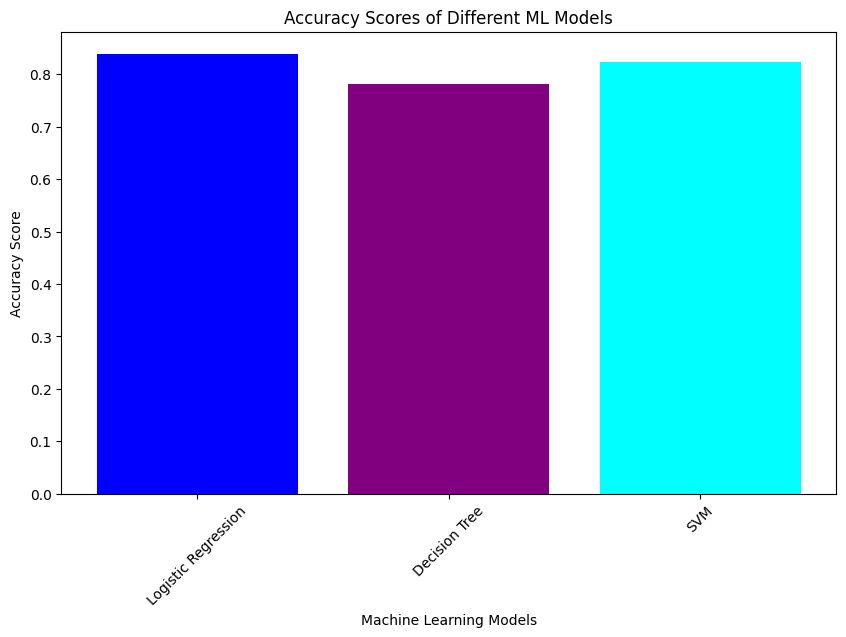

In [ ]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'Decision Tree', 'SVM']
accuracy_scores = [accuracy_lr, accuracy_dt, accuracy_svm]

# Create the bar graph
plt.figure(figsize=(10, 6))
plt.bar(models, accuracy_scores, color=['blue', 'purple', 'cyan'])

# Add title and labels
plt.title('Accuracy Scores of Different ML Models')
plt.xlabel('Machine Learning Models')
plt.ylabel('Accuracy Score')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()